In [55]:
###########################################
# 1) GET DATA FROM THE 8 GEM POWER TRACKERS
###########################################
import pandas
from pylab import *
import matplotlib.pyplot as plt
import warnings
import matplotlib.gridspec as gridspec
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

warnings.simplefilter('ignore')
bio=pandas.read_excel('./Global-Bioenergy-Power-Tracker-GBPT-V1.xlsx',sheet_name='Data')
hydro=pandas.read_excel('./Global-Hydropower-Tracker-May-2023.xlsx',sheet_name='Data')
nuclear=pandas.read_excel('./Global-Nuclear-Power-Tracker-October-2023.xlsx',sheet_name='Data')
wind=pandas.read_excel('./Global-Wind-Power-Tracker-December-2023.xlsx',sheet_name='Data')
solar=pandas.read_excel('./Global-Solar-Power-Tracker-December-2023.xlsx',sheet_name='Data')
geo=pandas.read_excel('./Global-Geothermal-Power-Tracker-July-2023.xlsx',sheet_name='Data')
coal=pandas.read_excel('./Global-Coal-Plant-Tracker-July-2023.xlsx',sheet_name='Units')
oil=pandas.read_excel('./Global-Oil-and-Gas-Plant-Tracker-GOGPT-August-2023.xlsx',sheet_name='Oil & Gas Units')
#
hydro.rename(columns={'Country 1': 'Country'}, inplace=True)
bio.rename(columns={'Operating status': 'Status'}, inplace=True)
bio.rename(columns={'Project name': 'Project Name'}, inplace=True)
hydro.rename(columns={'Project name': 'Project Name'}, inplace=True)
geo.rename(columns={'Unit Capacity (MW)': 'Capacity (MW)'}, inplace=True)
oil=oil[pandas.to_numeric(oil['Capacity (MW)'], errors='coerce').notnull()]
for i in [bio,hydro,nuclear,wind,solar,geo,coal,oil]:
    try:
        i['Capacity (MW)']=(i['Capacity (MW)']/1000).values
    except Exception:
        i['Unit Capacity (MW)']=(i['Unit Capacity (MW)']/1000).values

for i in [bio,hydro,nuclear,wind,solar,geo,coal,oil]:
    try:
        i.loc[i['Start year']=='not found','Start year']=np.nan
    except Exception:
        try:
            i.loc[i['Start Year']=='not found','Start Year']=np.nan
        except Exception:
            i.loc[i['Unit start year']=='not found','Unit start year']=np.nan

oil=oil[pandas.to_numeric(oil['Start year'], errors='coerce').notnull()]
for i in [bio,hydro,nuclear,wind,solar,geo,coal,oil]:
    try:
        i['Start year']=i['Start year'].astype(float).values
    except Exception:
        try:
            i['Start Year']=i['Start Year'].astype(float).values
        except Exception:
            i['Unit start year']=i['Unit start year'].astype(float).values

In [7]:
#####################################################################################
# 2) MAKE EXCEL WORKBOOK WITH COUNTRY CAPACITY TOTALS, SPLIT BY TECHNOLOGY AND STATUS
#####################################################################################
from pandas import ExcelWriter
def country_cap_by_status(country):
    bio_cap_by_status=bio[bio.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('bio')
    hydro_cap_by_status=hydro[hydro['Country']==country].groupby('Status')['Capacity (MW)'].sum().rename('hydro')
    nuclear_cap_by_status=nuclear[nuclear.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('nuclear')
    wind_cap_by_status=wind[wind.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('wind')
    solar_cap_by_status=solar[solar.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('solar')
    geo_cap_by_status=geo[geo.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('geo')
    coal_cap_by_status=coal[coal.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('coal')
    oil_cap_by_status=oil[oil.Country==country].groupby('Status')['Capacity (MW)'].sum().rename('oil+gas')
    cap_by_status=pandas.concat([coal_cap_by_status,oil_cap_by_status,hydro_cap_by_status,wind_cap_by_status,nuclear_cap_by_status,solar_cap_by_status,bio_cap_by_status,geo_cap_by_status],axis=1)
    cap_by_status=cap_by_status.reindex(['operating','construction','pre-construction','announced','development','cancelled', 'mothballed', 'retired', 'shelved', 'inactive'])
    return cap_by_status.loc[['operating', 'construction', 'pre-construction', 'announced', 'development', 'cancelled', 'retired', 'shelved','inactive']]

res=[]
for i in [bio,hydro,nuclear,wind,solar,geo,coal,oil]:
    res.append(i['Country'].unique())

countries=np.unique(np.concatenate(res))
writer = ExcelWriter('.\Country_capacity_by_technology_and_status_.xlsx')
for country in countries:
    q=country_cap_by_status(country).fillna(0)
    q.index.name=country
    q.to_excel(writer,country)

writer.close()

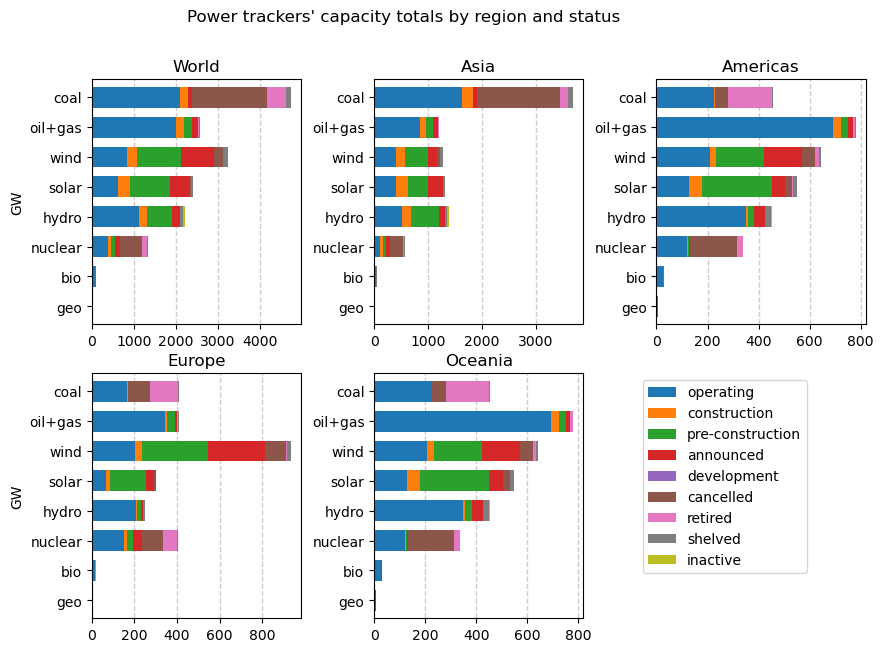

In [56]:
##################################################################################
# 3) MAKE BAR PLOTS OF CAPACITY PER REGION, WITH EACH TECHNOLOGY SPLIT BY STATUS
##################################################################################
def regional_cap_by_status(region):
    if region=='World':
        bio_cap_by_status=bio.groupby('Status')['Capacity (MW)'].sum().rename('bio')
        hydro_cap_by_status=hydro.groupby('Status')['Capacity (MW)'].sum().rename('hydro')
        nuclear_cap_by_status=nuclear.groupby('Status')['Capacity (MW)'].sum().rename('nuclear')
        wind_cap_by_status=wind.groupby('Status')['Capacity (MW)'].sum().rename('wind')
        solar_cap_by_status=solar.groupby('Status')['Capacity (MW)'].sum().rename('solar')
        geo_cap_by_status=geo.groupby('Status')['Capacity (MW)'].sum().rename('geo')
        coal_cap_by_status=coal.groupby('Status')['Capacity (MW)'].sum().rename('coal')
        oil_cap_by_status=oil.groupby('Status')['Capacity (MW)'].sum().rename('oil+gas')
        cap_by_status=pandas.concat([geo_cap_by_status,bio_cap_by_status,nuclear_cap_by_status,hydro_cap_by_status,solar_cap_by_status,wind_cap_by_status,oil_cap_by_status,coal_cap_by_status],axis=1)
        cap_by_status=cap_by_status.reindex(['operating','construction','pre-construction','announced','development','cancelled', 'mothballed', 'retired', 'shelved', 'inactive'])
    else:
        bio_cap_by_status=bio[bio.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('bio')
        hydro_cap_by_status=hydro[hydro['Region 1']==region].groupby('Status')['Capacity (MW)'].sum().rename('hydro')
        nuclear_cap_by_status=nuclear[nuclear.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('nuclear')
        wind_cap_by_status=wind[wind.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('wind')
        solar_cap_by_status=solar[solar.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('solar')
        geo_cap_by_status=geo[geo.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('geo')
        coal_cap_by_status=coal[coal.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('coal')
        oil_cap_by_status=oil[oil.Region==region].groupby('Status')['Capacity (MW)'].sum().rename('oil+gas')
        cap_by_status=pandas.concat([geo_cap_by_status,bio_cap_by_status,nuclear_cap_by_status,hydro_cap_by_status,solar_cap_by_status,wind_cap_by_status,oil_cap_by_status,coal_cap_by_status],axis=1)
        cap_by_status=cap_by_status.reindex(['operating','construction','pre-construction','announced','development','cancelled', 'mothballed', 'retired', 'shelved', 'inactive'])
    return cap_by_status.loc[['operating', 'construction', 'pre-construction', 'announced', 'development', 'cancelled', 'retired', 'shelved','inactive']]

fig = plt.figure(figsize=(11,7))
gs = gridspec.GridSpec(2,4)
gs.update(left=0.02,right=.98,wspace=0.35,hspace=0.2)
fig.suptitle('Power trackers\' capacity totals by region and status',horizontalalignment='right')
ax = fig.add_subplot(gs[0,0])
regional_cap_by_status('World').T.plot.barh(stacked=True,ax=ax,width=0.7,legend=False)
ax.set_axisbelow(True)
ax.xaxis.grid(True, which='major',color='gray', linestyle='dashed',linewidth=1,alpha=0.4)
ax.set_title('World')
ax.set_ylabel('GW')
ax = fig.add_subplot(gs[0,1])
regional_cap_by_status('Asia').T.plot.barh(stacked=True,ax=ax,width=0.7,legend=False)
ax.set_axisbelow(True)
ax.xaxis.grid(True, which='major',color='gray', linestyle='dashed',linewidth=1,alpha=0.4)
ax.set_title('Asia')
ax = fig.add_subplot(gs[0,2])
ax.set_title('Americas')
regional_cap_by_status('Americas').T.plot.barh(stacked=True,ax=ax,width=0.7,legend=False)
ax.set_axisbelow(True)
ax.xaxis.grid(True, which='major',color='gray', linestyle='dashed',linewidth=1,alpha=0.4)
ax = fig.add_subplot(gs[1,0])
ax.set_ylabel('GW')
ax.set_title('Europe')
regional_cap_by_status('Europe').T.plot.barh(stacked=True,ax=ax,width=0.7,legend=False)
ax.set_axisbelow(True)
ax.xaxis.grid(True, which='major',color='gray', linestyle='dashed',linewidth=1,alpha=0.4)
ax = fig.add_subplot(gs[1,1])
ax.set_title('Oceania')
regional_cap_by_status('Americas').T.plot.barh(stacked=True,ax=ax,width=0.7,legend=False)
ax.legend(bbox_to_anchor=[1.25,1])
ax.set_axisbelow(True)
ax.xaxis.grid(True, which='major',color='gray', linestyle='dashed',linewidth=1,alpha=0.4)


In [57]:
################################################################################################
# 4) MAP ALL RENEWABLE SOURCES IN THE USA TO PLANT LEVEL BASED ON GEM LOCATION AND CAPACITY DATA
################################################################################################
import geopandas
import geodatasets
from shapely.geometry import Polygon, MultiPolygon, Point, shape, LinearRing,LineString
import geopandas as gpd
res=[]
for i,j in zip([bio,hydro,nuclear,wind,solar,geo],['bio','hydro','nuclear','wind','solar','geo']):
    i=i[i.Status=='operating']
    i=i[i.Country=='United States']
    i['Technology']=j
    i=i.groupby('Project Name', as_index=False).agg({'Capacity (MW)':'sum', 'Project Name':'first','Technology':'first','Country':'first','Longitude':'first','Latitude':'first'})
    res.append(i[['Capacity (MW)','Country','Project Name','Longitude','Latitude','Technology']])

source=pandas.concat(res)
points=[Point(float(source.Longitude.values[i]),float(source.Latitude.values[i])) for i in range(len(source))]
source['centroid']=points
source_gpd=gpd.GeoDataFrame(source,geometry=source.centroid,crs=4326).reset_index(drop=True)
source_gpd = source_gpd.to_crs({'init': 'epsg:3857'})
source_gpd['buff']=source_gpd.buffer(25000*source_gpd['Capacity (MW)'])
source_gpd2=source_gpd[['Capacity (MW)','buff','Country','Project Name','Technology']]
source_gpd2=source_gpd2.set_geometry('buff')

source_gpd2.explore(tiles="CartoDB positron",column="Technology",tooltip=["Technology","Project Name",'Capacity (MW)'],cmap=['purple','grey','green','red','yellow','blue'])   

Text(0.5, 0.98, 'Coal-fired generating capacity (in GW) from the year 2000 to 2023 \nand number of year since peak capacity')

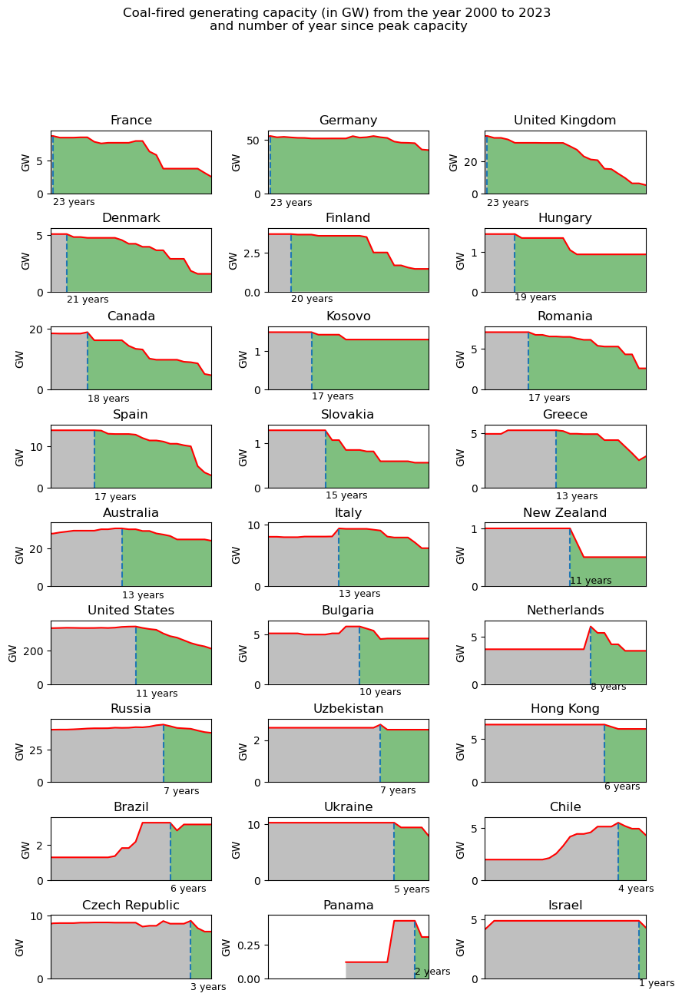

In [58]:
######################################################################################
# 5) PLOT COAL-FIRED CAPACITY SINCE YEAR 2000 FOR 27 COUNTRIES POST-PEAK COAL CAPACITY
######################################################################################
names=['France','Germany','United Kingdom','Denmark','Finland','Hungary','Canada','Kosovo','Romania','Spain','Slovakia','Greece','Australia','Italy','New Zealand','United States','Bulgaria','Netherlands','Russia','Uzbekistan','Hong Kong','Brazil','Ukraine','Chile','Czech Republic','Panama', 'Israel']
#names=['France','Germany','United Kingdom']
fig = plt.figure(figsize=(10,16))
gs1 = gridspec.GridSpec(10, 3)
gs1.update(wspace=0.35,hspace=0.55)
axs = []
years_since=[]
for name, num in zip(names, range(1,31)):
    status=['operating','retired','mothballed']
    alltime_coal=(coal[(coal['Status'].isin(status))&(coal['Country']==name)].groupby('Start year')['Capacity (MW)'].sum().cumsum())
    alltime_coal.index=pandas.to_datetime(alltime_coal.index.values, format='%Y')
    alltime_coal['2024']=np.nan
    alltime_coal=alltime_coal.resample('A').ffill()[:'2023']#.plot()

    status=['retired','mothballed']
    retired_coal=coal[(coal['Status'].isin(status))&(coal['Country']==name)]#.groupby('Start year')['Capacity (MW)'].sum().cumsum())
    res1=[]
    for i in range(len(retired_coal)):
        try:
            idx=pandas.date_range(str(round(retired_coal.iloc[i]['Start year'])),str(round(retired_coal.iloc[i]['Retired year']+1)), freq='A')    
            res1.append(pandas.DataFrame(len(idx)*[retired_coal.iloc[i]['Capacity (MW)']],index=idx))
        except Exception:
            i

    status=['operating']
    retired_coal=coal[(coal['Status'].isin(status))&(coal['Country']==name)]#.groupby('Start year')['Capacity (MW)'].sum().cumsum())
    res2=[]
    for i in range(len(retired_coal)):
        try:
            idx=pandas.date_range(str(round(retired_coal.iloc[i]['Start year'])),'2024', freq='A')    
            res2.append(pandas.DataFrame(len(idx)*[retired_coal.iloc[i]['Capacity (MW)']],index=idx))
        except Exception:
            i

    axs.append(fig.add_subplot(gs1[num-1]))
       
    if len(res1)>=1:
        axs[-1].plot((pandas.concat([pandas.concat(res1,axis=1).sum(axis=1),pandas.concat(res2,axis=1).sum(axis=1)],axis=1).sum(axis=1))['1990':],label='net',c='r')
        net=(pandas.concat([pandas.concat(res1,axis=1).sum(axis=1),pandas.concat(res2,axis=1).sum(axis=1)],axis=1).sum(axis=1))
    else:
        axs[-1].plot(pandas.concat(res2,axis=1).sum(axis=1)['1990':],label='net',c='r')
        net=pandas.concat(res2,axis=1).sum(axis=1)

    axs[-1].set_title(name)
    axs[-1].vlines(x=net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1]),ymin=0,ymax=net.loc[str(net[(net<net.max())==False].index.year[-1])][0],linestyle='--')
    axs[-1].margins(x=0)
    axs[-1].set_xlim(pandas.Timestamp('2000-08-30'), pandas.Timestamp('2023-12-31'))
    axs[-1].set_ylim(0,net.max()+net.max()*.1)
    axs[-1].set_xticks([])
    axs[-1].set_xticklabels([])
    axs[-1].set_ylabel('GW')

    axs[-1].fill_between(net.loc[:str((net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1])).year)].index, 0, net.loc[:str((net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1])).year)],facecolor='grey',alpha=0.5)
    axs[-1].fill_between(net.loc[str((net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1])).year):].index, 0, net.loc[str((net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1])).year):],facecolor='green',alpha=0.5)
    axs[-1].text((net.index[-1]-pandas.DateOffset(years=2023-net[(net<net.max())==False].index.year[-1])),net.min()-net.max()*.21, str(2023-net[(net<net.max())==False].index.year[-1])+" years",fontsize=9)#, transform=ax.transData)
    
fig.suptitle('Coal-fired generating capacity (in GW) from the year 2000 to 2023 \nand number of year since peak capacity')#,horizontalalignment='right')